In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls "/content/drive/MyDrive"

'Colab Notebooks'
 test_dataset-20260614T074239Z-3-001.zip
 train_dataset-20260614T160757Z-3-001.zip
 train_dataset-20260614T160757Z-3-002.zip


In [ ]:
import zipfile

zip_files = [
    "/content/drive/MyDrive/train_dataset-20260614T160757Z-3-001.zip",
    "/content/drive/MyDrive/train_dataset-20260614T160757Z-3-002.zip"
]


for zip_path in zip_files:
    print(f"Extracting {zip_path}...")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall('/content/train_dataset')

print("Extraction completed!")

Extracting /content/drive/MyDrive/train_dataset-20260614T160757Z-3-001.zip...
Extracting /content/drive/MyDrive/train_dataset-20260614T160757Z-3-002.zip...
Extraction completed!


In [ ]:
!ls /content/train_dataset

train_dataset


In [ ]:
!ls -l /content/train_dataset/train_dataset

total 256
drwxr-xr-x 3 root root   4096 Jun 14 16:22  231129_CTD
drwxr-xr-x 3 root root   4096 Jun 14 16:22 'Adani GP-III CG'
drwxr-xr-x 3 root root   4096 Jun 14 16:22 'Deora Limestone Mine'
drwxr-xr-x 3 root root   4096 Jun 14 16:21 'Egypt-New city'
-rw-r--r-- 1 root root 215660 Jun 14 16:21  gcp_marks.json
drwxr-xr-x 3 root root   4096 Jun 14 16:21 'RDCW-Reddipalayam Limestone Mine'
drwxr-xr-x 4 root root   4096 Jun 14 16:21  scout_966
drwxr-xr-x 5 root root   4096 Jun 14 16:23  scout_971
drwxr-xr-x 3 root root   4096 Jun 14 16:23  scout_973
drwxr-xr-x 3 root root   4096 Jun 14 16:21 'Seashell Ras el Hekma'
drwxr-xr-x 3 root root   4096 Jun 14 16:21 'UTCL UNCL Additional Area'
drwxr-xr-x 3 root root   4096 Jun 14 16:22 'Vedanta GOA Bicholim'


In [ ]:
import json
import os
import collections

# Path where your JSON file lives based on your extraction
json_path = "/content/train_dataset/train_dataset/gcp_marks.json"

with open(json_path, 'r') as f:
    annotations = json.load(f)

print(f"✅ Loaded annotations successfully!")
print(f"Total training images available: {len(annotations)}\n")

# Count the occurrences of each physical marker shape
shapes = [metadata['verified_shape'] for img_path, metadata in annotations.items() if 'verified_shape' in metadata]
shape_counts = collections.Counter(shapes)

print("📊 Shape Class Distribution:")
for shape, count in shape_counts.items():
    percentage = (count / len(annotations)) * 100
    print(f" - {shape}: {count} images ({percentage:.2f}%)")

✅ Loaded annotations successfully!
Total training images available: 1000

📊 Shape Class Distribution:
 - Cross: 177 images (17.70%)
 - Square: 328 images (32.80%)
 - L-Shape: 491 images (49.10%)


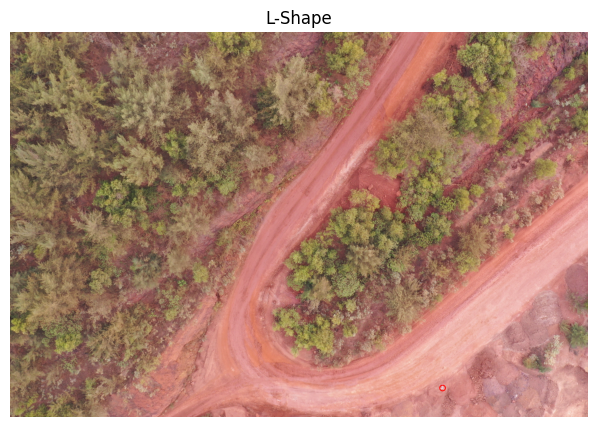

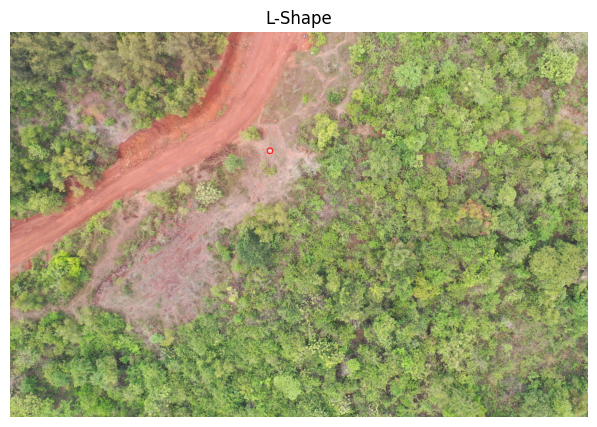

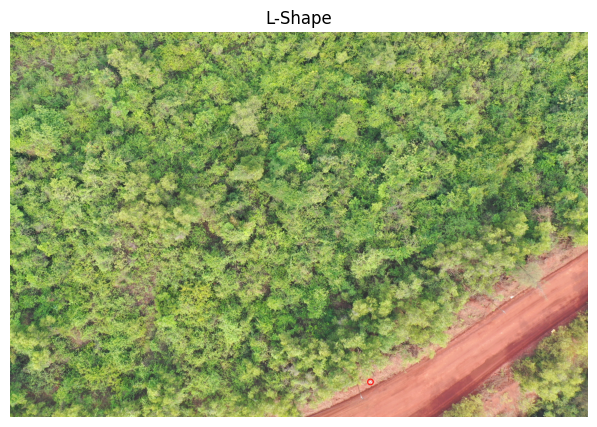

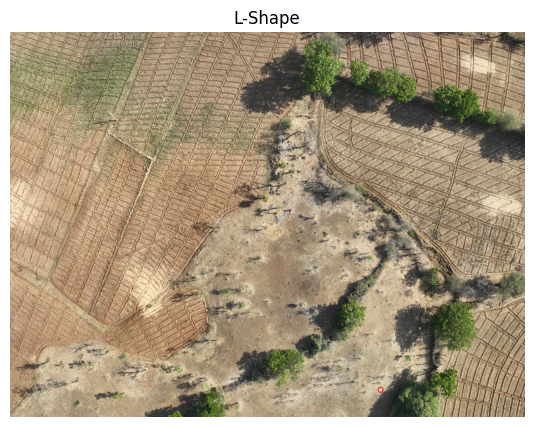

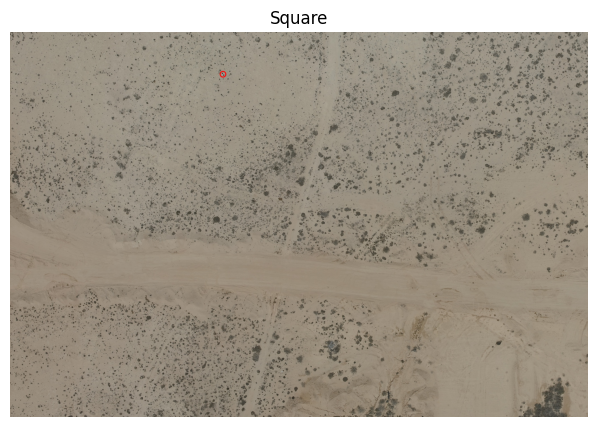

...

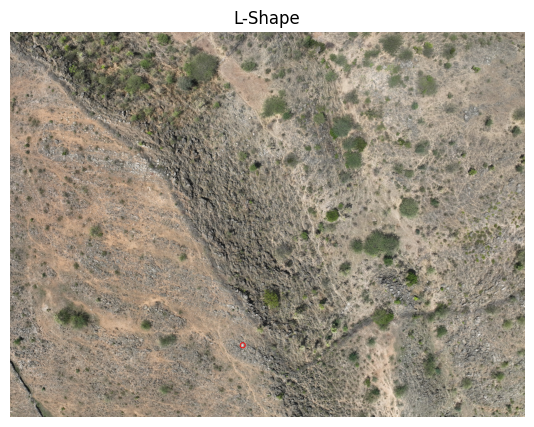

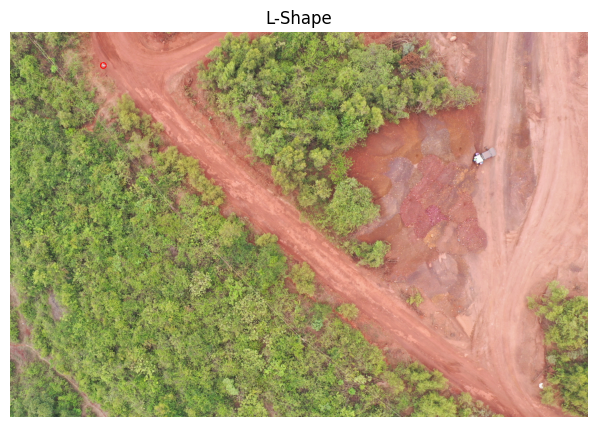

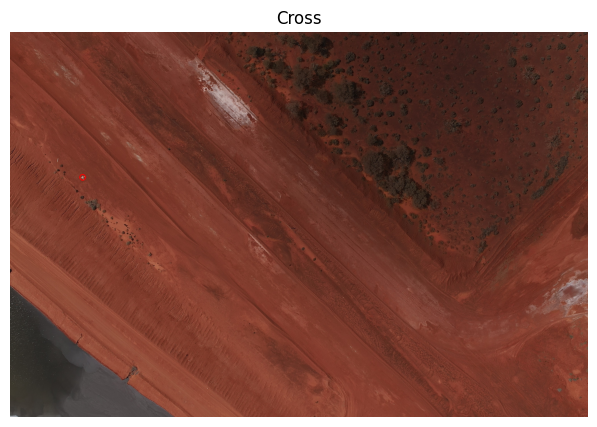

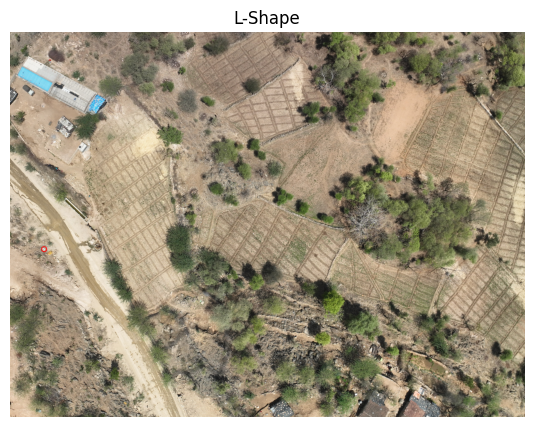

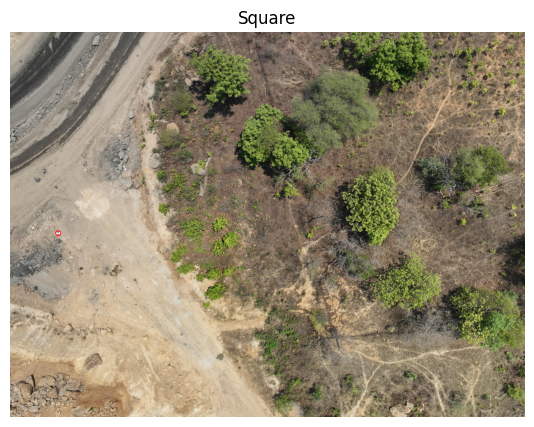

In [ ]:
import os
import json
import random
import cv2
import matplotlib.pyplot as plt

with open("/content/train_dataset/train_dataset/gcp_marks.json") as f:
    labels = json.load(f)

samples = random.sample(list(labels.items()), 20)

for path, ann in samples:
    img_path = os.path.join(
        "/content/train_dataset/train_dataset",
        path
    )

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    x = int(ann["mark"]["x"])
    y = int(ann["mark"]["y"])

    cv2.circle(img, (x, y), 20, (255, 0, 0), 5)

    plt.figure(figsize=(8,5))
    plt.imshow(img)
    plt.title(ann["verified_shape"])
    plt.axis("off")
    plt.show()

X range: 66.96412957110547 3937.0554836417386
Y range: 35.044623574285524 2914.109404383081


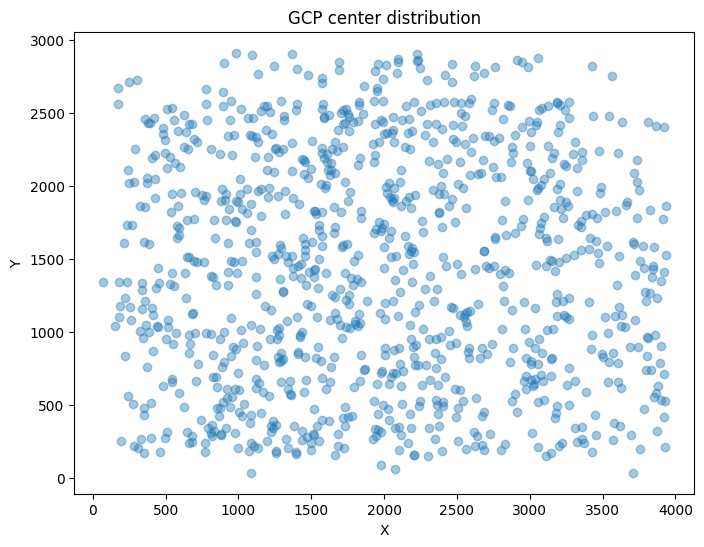

In [ ]:
xs = [v["mark"]["x"] for v in labels.values()]
ys = [v["mark"]["y"] for v in labels.values()]

print("X range:", min(xs), max(xs))
print("Y range:", min(ys), max(ys))

plt.figure(figsize=(8,6))
plt.scatter(xs, ys, alpha=0.4)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("GCP center distribution")
plt.show()

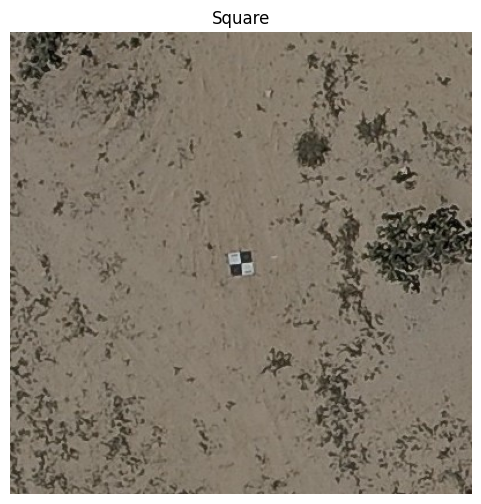

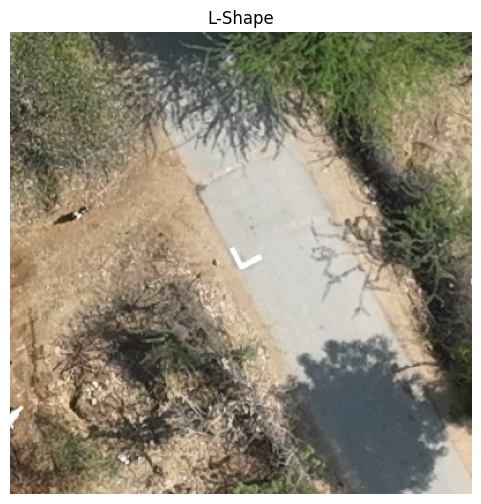

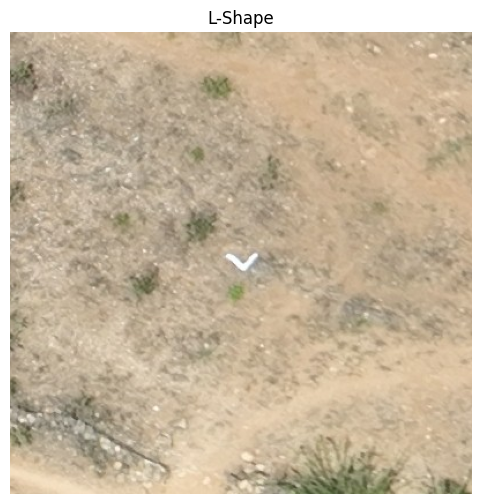

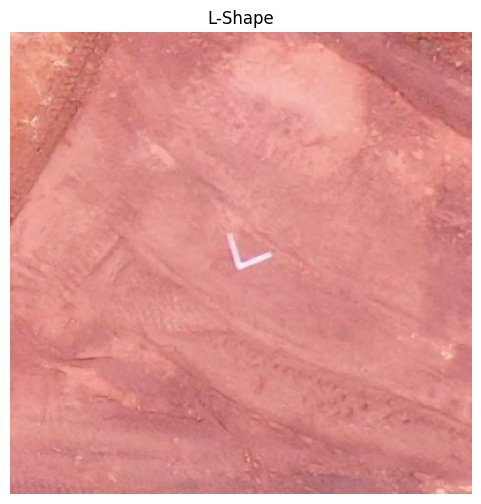

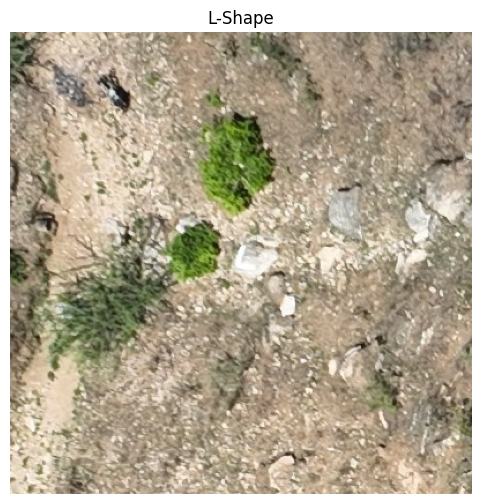

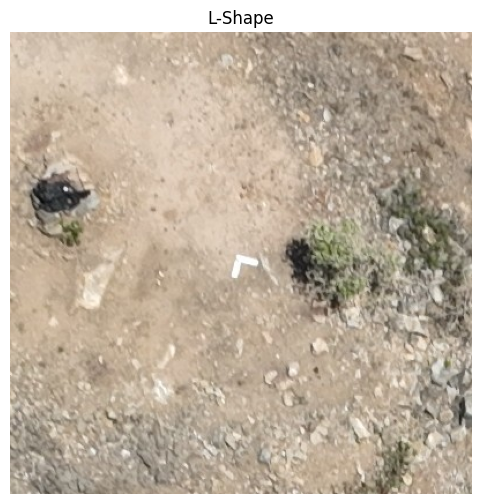

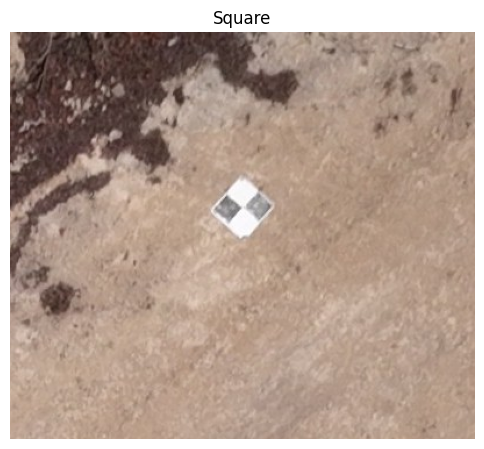

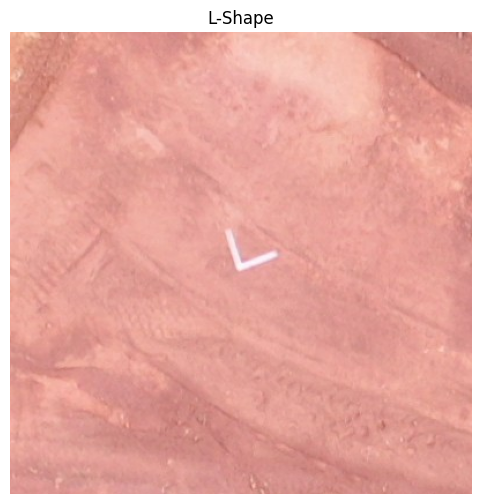

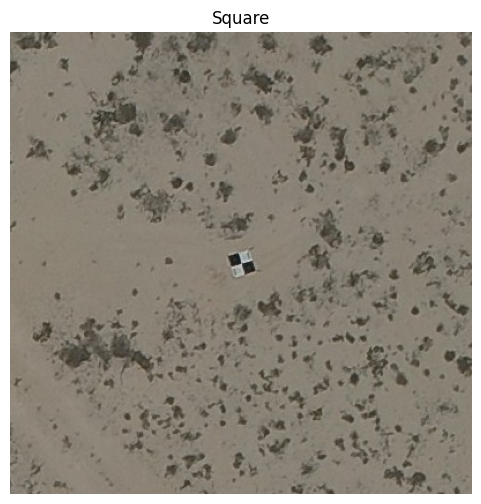

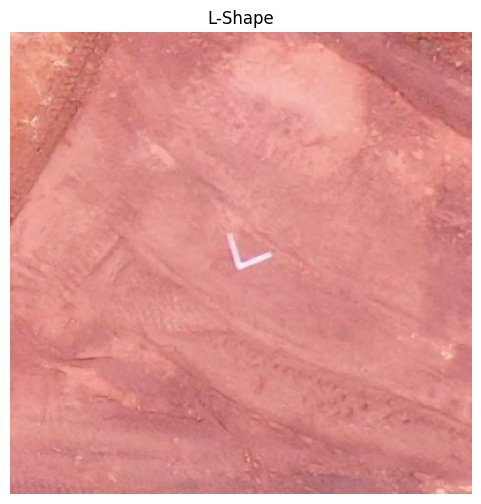

In [ ]:
import random
import cv2
import matplotlib.pyplot as plt

for _ in range(10):

    path, ann = random.choice(list(labels.items()))

    img_path = os.path.join(
        "/content/train_dataset/train_dataset",
        path
    )

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    x = int(ann["mark"]["x"])
    y = int(ann["mark"]["y"])

    crop_size = 200

    crop = img[
        max(0, y-crop_size):min(img.shape[0], y+crop_size),
        max(0, x-crop_size):min(img.shape[1], x+crop_size)
    ]

    plt.figure(figsize=(6,6))
    plt.imshow(crop)
    plt.title(ann["verified_shape"])
    plt.axis("off")
    plt.show()

In [ ]:
import json

with open("/content/train_dataset/train_dataset/gcp_marks.json") as f:
    labels = json.load(f)

first_key = list(labels.keys())[0]

print(first_key)
print(labels[first_key])

scout_971/a61f66617a8dcf132dcc2cfa/GCP-11/DJI_20240301143538_0057_V.JPG
{'mark': {'x': 3272.769145523532, 'y': 1089.3292198344861}, 'verified_shape': 'Cross'}


In [ ]:
rows = []

for img_path, ann in labels.items():

    shape = ann.get("verified_shape")

    if shape is None:
        continue

    rows.append({
        "path": img_path,
        "shape": shape,
        "x": ann["mark"]["x"],
        "y": ann["mark"]["y"]
    })
print("Usable samples:", len(rows))

Usable samples: 996


In [ ]:
#train/validation splitting of dataset
import pandas as pd
from sklearn.model_selection import train_test_split

rows = []

for img_path, ann in labels.items():

    if "verified_shape" not in ann:
        continue

    rows.append({
        "path": img_path,
        "shape": ann["verified_shape"],
        "x": ann["mark"]["x"],
        "y": ann["mark"]["y"]
    })

df = pd.DataFrame(rows)

train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    stratify=df["shape"],
    random_state=42
)

print("Train:", len(train_df))
print("Val:", len(val_df))

print("\nTrain Distribution")
print(train_df["shape"].value_counts())

print("\nValidation Distribution")
print(val_df["shape"].value_counts())

Train: 796
Val: 200

Train Distribution
shape
L-Shape    392
Square     262
Cross      142
Name: count, dtype: int64

Validation Distribution
shape
L-Shape    99
Square     66
Cross      35
Name: count, dtype: int64


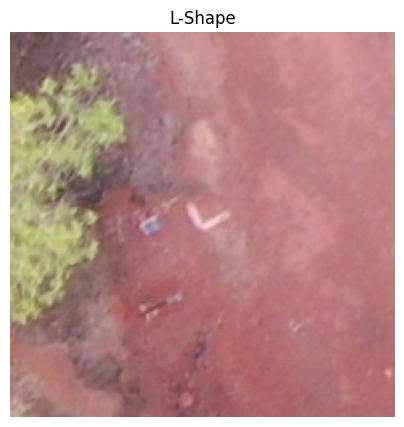

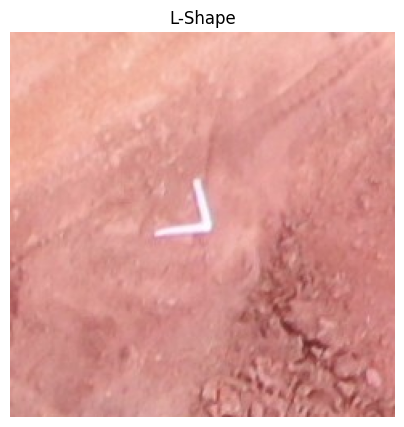

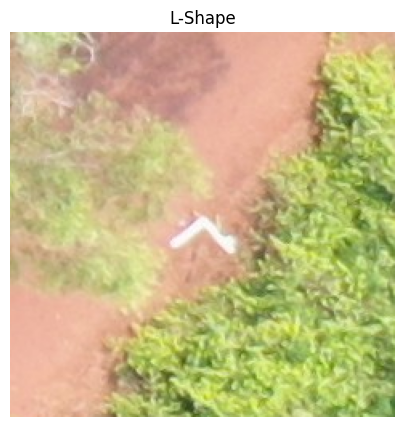

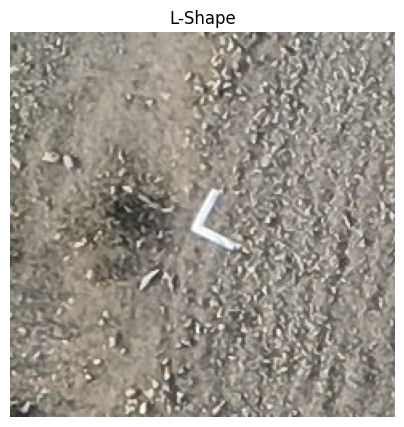

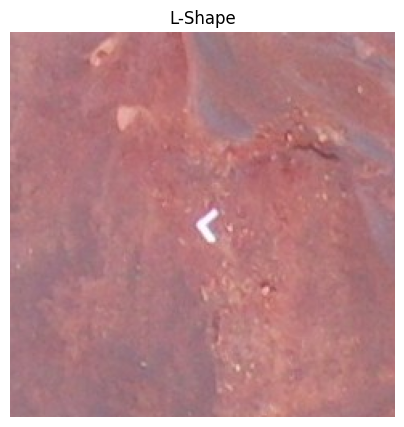

In [ ]:
import random
import cv2
import matplotlib.pyplot as plt

for _ in range(5):

    row = train_df.sample(1).iloc[0]

    img_path = "/content/train_dataset/train_dataset/" + row["path"]

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    x = int(row["x"])
    y = int(row["y"])

    crop = img[
        max(0, y-120):min(img.shape[0], y+120),
        max(0, x-120):min(img.shape[1], x+120)
    ]

    plt.figure(figsize=(5,5))
    plt.imshow(crop)
    plt.title(row["shape"])
    plt.axis("off")
    plt.show()

In [ ]:
from collections import Counter

project_counts = Counter()

for path in df["path"]:
    project_counts[path.split("/")[0]] += 1

for project, count in sorted(project_counts.items()):
    print(project, count)

231129_CTD 85
Adani GP-III CG 105
Deora Limestone Mine 41
Egypt-New city 71
RDCW-Reddipalayam Limestone Mine 29
Seashell Ras el Hekma 152
UTCL UNCL Additional Area 198
Vedanta GOA Bicholim 252
scout_966 52
scout_971 10
scout_973 1


In [ ]:
import os

ROOT = "/content/gcp_yolo"

folders = [
    "images/train",
    "images/val",
    "labels/train",
    "labels/val"
]

for f in folders:
    os.makedirs(os.path.join(ROOT, f), exist_ok=True)

print("Folders created")

Folders created


In [ ]:
import os
import shutil
import cv2

IMG_ROOT = "/content/train_dataset/train_dataset"

CLASS_MAP = {
    "Cross": 0,
    "Square": 1,
    "L-Shape": 2,
    "L-Shaped": 2
}

BOX_SIZE = 100

def create_dataset(split_df, split_name):

    for _, row in split_df.iterrows():

        rel_path = row["path"]

        img_path = os.path.join(IMG_ROOT, rel_path)

        if not os.path.exists(img_path):
            continue

        img = cv2.imread(img_path)

        if img is None:
            continue

        h, w = img.shape[:2]

        x = float(row["x"])
        y = float(row["y"])

        cls = CLASS_MAP[row["shape"]]

        xc = x / w
        yc = y / h

        bw = BOX_SIZE / w
        bh = BOX_SIZE / h

        filename = rel_path.replace("/", "_")

        img_dst = f"/content/gcp_yolo/images/{split_name}/{filename}"
        label_dst = f"/content/gcp_yolo/labels/{split_name}/{filename.rsplit('.',1)[0]}.txt"

        shutil.copy(img_path, img_dst)

        with open(label_dst, "w") as f:
            f.write(f"{cls} {xc} {yc} {bw} {bh}\n")

create_dataset(train_df, "train")
create_dataset(val_df, "val")

print("Dataset generation complete")

Dataset generation complete


In [ ]:
yaml_content = """
path: /content/gcp_yolo

train: images/train
val: images/val

names:
  0: Cross
  1: Square
  2: L-Shape
"""

with open("/content/gcp.yaml", "w") as f:
    f.write(yaml_content)

print("gcp.yaml created")

gcp.yaml created


In [ ]:
!pip install -q ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 35.5 MB/s eta 0:00:00


In [34]:
from ultralytics import YOLO
import torch

print("CUDA:", torch.cuda.is_available())
if torch.cuda.is_available():
    print(torch.cuda.get_device_name(0))

model = YOLO("yolov8n.pt")

results = model.train(
    data="/content/gcp.yaml",

    # Training
    epochs=20,
    imgsz=1280,
    batch=8,

    # Hardware
    device=0,
    workers=2,

    # Stability
    patience=10,

    # Save outputs
    save=True,
    plots=True
)

       4/20      4.48G      1.432       4.57      1.029          4       1280: 100% ━━━━━━━━━━━━ 100/100 1.1s/it 1:54
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 13/13 1.2s/it 15.4s
                   all        200        200      0.084      0.382      0.076     0.0465

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       5/20      4.48G       1.38      4.124       1.01          6       1280: 100% ━━━━━━━━━━━━ 100/100 1.1s/it 1:55
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 13/13 1.3s/it 16.8s
                   all        200        200       0.33      0.426      0.312      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
       6/20      4.48G      1.343      3.328     0.9924          6       1280: 100% ━━━━━━━━━━━━ 100/100 1.1s/it 1:53
                 Class     Images  Instances      Box(

In [48]:
import zipfile
import os

os.makedirs("/content/test_dataset", exist_ok=True)

with zipfile.ZipFile(
    "/content/drive/MyDrive/test_dataset-20260614T074239Z-3-001.zip",
    "r"
) as zip_ref:
    zip_ref.extractall("/content/test_dataset")

print("Test dataset extracted!")

Test dataset extracted!


In [49]:
!find /content/test_dataset -type f | head -10

/content/test_dataset/test_dataset/Juniper Gujarat/Gujarat20-04-24/GCP3/DJI_20240420162131_0074_V.JPG
/content/test_dataset/test_dataset/CSTEP BENGALURU EXTN/EXTN PROCESS_07/Z22_GCP5/DJI_20250317104731_0194_V.JPG
/content/test_dataset/test_dataset/CSTEP BENGALURU EXTN/EXTN PROCESS_07/Z21_GCP9/DJI_20250312112137_0196_V.JPG
/content/test_dataset/test_dataset/Ramco Alathiyur South/16940_MCDR2024/TGCP2/1_DJI_0159.JPG
/content/test_dataset/test_dataset/Ramco Alathiyur South/16940_MCDR2024/GCP13/1_DJI_0298.JPG
/content/test_dataset/test_dataset/Radiance Karnataka-Korwar/Phase 2 Feb2025/GCP3/DJI_20250215160139_0206_V.JPG
/content/test_dataset/test_dataset/Arghat Limestone Mine/MCDR 2024/GCP-19/DJI_20240422085235_0055_V.JPG
/content/test_dataset/test_dataset/Paraswani Limestone Mine/Dec-2024/GCP-47/DJI_20241220100346_0277_V.JPG
/content/test_dataset/test_dataset/Paraswani Limestone Mine/Dec-2024/GCP-62/DJI_20241220152524_0246_V.JPG
/content/test_dataset/test_dataset/Paraswani Limestone Mine/De

In [51]:
from ultralytics import YOLO
import os
import json
from tqdm import tqdm

# Load best model
model = YOLO("/content/drive/MyDrive/gcp_best_model.pt")

TEST_ROOT = "/content/test_dataset/test_dataset"

CLASS_MAP = {
    0: "Cross",
    1: "Square",
    2: "L-Shape"
}

predictions = {}

# Collect all JPG files
image_paths = []

for root, dirs, files in os.walk(TEST_ROOT):
    for file in files:
        if file.lower().endswith(".jpg"):
            image_paths.append(os.path.join(root, file))

print(f"Found {len(image_paths)} test images")

Found 300 test images


In [52]:
for img_path in tqdm(image_paths):

    results = model.predict(
        img_path,
        conf=0.25,
        verbose=False
    )

    rel_path = os.path.relpath(img_path, TEST_ROOT)

    if len(results[0].boxes) == 0:
        # fallback
        predictions[rel_path] = {
            "mark": {
                "x": 0.0,
                "y": 0.0
            },
            "verified_shape": "Cross"
        }
        continue

    # highest confidence detection
    box = results[0].boxes[0]

    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()

    xc = float((x1 + x2) / 2.0)
    yc = float((y1 + y2) / 2.0)

    cls_id = int(box.cls[0].item())

    predictions[rel_path] = {
        "mark": {
            "x": xc,
            "y": yc
        },
        "verified_shape": CLASS_MAP[cls_id]
    }

print("Finished predictions")

100%|██████████| 300/300 [00:41<00:00,  7.30it/s]

Finished predictions


In [53]:
output_file = "/content/predictions.json"

with open(output_file, "w") as f:
    json.dump(predictions, f, indent=2)

print(f"Saved: {output_file}")
print(f"Entries: {len(predictions)}")

Saved: /content/predictions.json
Entries: 300


In [56]:
!cp /content/predictions.json \
    /content/drive/MyDrive/predictions.json